# Introdução

Binary Classification with a Tabular Stroke Prediction Dataset

Grupo:

- Giovanni Mendes Lima
- Darlinne Hubert Palo Soto
- Henrique Reis Innecco
- João Paulo Ponte
- João Pedro Reis Martins


# Importando Bibliotecas

In [153]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [154]:
%%html
<style>
table {float:left}
</style>

# Análise Descritiva dos Dados

In [155]:
df = pd.read_csv('train.csv')

In [156]:
df.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,0,Male,28.0,0,0,Yes,Private,Urban,79.53,31.1,never smoked,0
1,1,Male,33.0,0,0,Yes,Private,Rural,78.44,23.9,formerly smoked,0
2,2,Female,42.0,0,0,Yes,Private,Rural,103.00,40.3,Unknown,0
3,3,Male,56.0,0,0,Yes,Private,Urban,64.87,28.8,never smoked,0
4,4,Female,24.0,0,0,No,Private,Rural,73.36,28.8,never smoked,0


Variável | Descrição
|:-- | :-- |
Gender| Gênero 
Age | Idade
Hypertension | Indivíduo tem ou não tem hipertensão 
Heart_Disease | Indivíduo tem  ou não tem doença no coração 
Ever_Married | Indivíduo já se casou  ou não 
Work_Type | Setor/Tipo de trabalho do profissional
Residence_type | Zona urbana ou rural
Avg_Glucose_Level | Nível médio de glicose
Smoking_Status | Nível de tabagismo
Stroke | Teve AVC ou não


In [157]:
df.describe()

,id,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
count,15304.000000,15304.000000,15304.000000,15304.000000,15304.000000,15304.000000,15304.000000
mean,7651.500000,41.417708,0.049726,0.023327,89.039853,28.112721,0.041296
std,4418.028595,21.444673,0.217384,0.150946,25.476102,6.722315,0.198981
min,0.000000,0.080000,0.000000,0.000000,55.220000,10.300000,0.000000
25%,3825.750000,26.000000,0.000000,0.000000,74.900000,23.500000,0.000000
50%,7651.500000,43.000000,0.000000,0.000000,85.120000,27.600000,0.000000
75%,11477.250000,57.000000,0.000000,0.000000,96.980000,32.000000,0.000000
max,15303.000000,82.000000,1.000000,1.000000,267.600000,80.100000,1.000000


Aparentemente, não é possivel observar nenhum dado inconsistente.

In [158]:
df.isnull().sum()

id                   0
gender               0
age                  0
hypertension         0
heart_disease        0
ever_married         0
work_type            0
Residence_type       0
avg_glucose_level    0
bmi                  0
smoking_status       0
stroke               0
dtype: int64

Não foi encontrando nenhum valor nulo no conjunto de dados.

# Análise Exploratória dos Dados

## Gênero

In [159]:
fig = px.pie(df, 
             names='gender', 
             color='gender',
             hole=0.5,
             color_discrete_map={'Male':'darkblue',
                                 'Female':'pink',
                                 'Other':'red'})

fig.update_layout(
    title_text="Proporção de Indivíduos por Gênero",
    annotations=[dict(text='Gênero', x=0.5, y=0.5, font_size=20, showarrow=False)])

fig.show()

A maioria dos indivíduos do conjunto de dados são **mulheres**, cerca de **61,7%** dos indivíduos, seguido pelos homens com 38,3% e outros com uma pequena porcentagem dos dados.

## Idade

In [160]:
df['age'].describe()

count    15304.000000
mean        41.417708
std         21.444673
min          0.080000
25%         26.000000
50%         43.000000
75%         57.000000
max         82.000000
Name: age, dtype: float64

A idade média dos indivíduos do grupo foi de 41.41 anos, com um desvio padrão de por volta de 21.44 e uma mediana igual a 43.

In [161]:
import plotly.figure_factory as ff
df = df[df['age'] > 2]
hist_data = [df['age'].values]
group_labels = ['Idade'] # name of the dataset

fig = ff.create_distplot(hist_data,
                         group_labels,
                         colors=['#473db3'])
fig.show()

É possível observar uma distribuição de idade dispersa.

## Hipertensão

In [162]:
fig = px.pie(df['hypertension'].replace({0:'Não Hipertenso', 1:'Hipertenso'}), 
             names='hypertension', 
             color='hypertension',
             hole=0.5,
             color_discrete_map={'Não Hipertenso':'#149692',
                                 'Hipertenso':'red'})

fig.update_layout(
    title_text="Proporção de Indivíduos por Diagnóstico de Hipertensão",
    annotations=[dict(text='Hipertensão', x=0.5, y=0.5, font_size=20, showarrow=False)])
                 
fig.show()

## Doença no Coração

In [163]:
fig = px.bar(df['heart_disease'].value_counts().to_frame().reset_index().replace({0:'Não', 1:'Sim'}),
             x="heart_disease", 
             y="count", 
             text_auto='.5s',
             color = "heart_disease",
             color_discrete_map={'Não':'#03a5fc',
                                 'Sim':'red'})

fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
}, title='Quantidade de indivíduos com e sem doença no coração')
fig.update_yaxes(title='Quantidade')
fig.update_xaxes(title='Doença no coração')

fig.update_traces(textfont_size=14, 
                  textangle=0, 
                  textposition="outside")
fig.show()

## Casamento

In [164]:
fig = px.pie(df['ever_married'].replace({'Yes':'Sim', 'No':'Não'}), 
             names='ever_married', 
             color='ever_married',
             hole=0.5,
             color_discrete_map={'Não':'black',
                                 'Sim':'red'})
fig.update_layout(
    title_text="Já casou ou é casado?",
    annotations=[dict(text='Casamento', x=0.5, y=0.5, font_size=20, showarrow=False)])
                 

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

## Setor/Tipo de Trabalho dos Profissionais

In [165]:
df_profissional = (df['work_type'].str.get_dummies().sum().sort_values(ascending=False) / df.shape[0]).to_frame()
df_profissional = df_profissional.rename_axis('setor/tipo').reset_index()
df_profissional = df_profissional.rename(columns={0:'proporcao'})

fig = px.bar(df_profissional, 
             x='setor/tipo',
             y='proporcao',
             text=df_profissional['proporcao'].apply(lambda x: '{:.2f}%'.format(x*100)),
             color='setor/tipo')

fig.update_layout(xaxis={'categoryorder':'total ascending'})
                 
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
}, title='Proporção de profissionais por setor/tipo')

fig.update_traces(textfont_size=14, 
                  textangle=0, 
                  textposition="outside")


fig.update_yaxes(title='Percentual %')
fig.update_xaxes(title='Tipo de profissional')



fig.show()

## Zona onde Mora

In [166]:
df_zona = (df['Residence_type'].str.get_dummies().sum().sort_values(ascending=False) / df.shape[0]).to_frame()
df_zona = df_zona.rename_axis('zona').reset_index()
df_zona = df_zona.rename(columns={0:'proporcao'})

fig = px.bar(df_zona, 
             x='zona',
             y='proporcao',
             text=df_zona['proporcao'].apply(lambda x: '{:.2f}%'.format(x*100)),
             color='zona',
             color_discrete_map={'Urban':'#03a5fc',
                                 'Rural':'#0fd156'})

fig.update_layout(xaxis={'categoryorder':'total ascending'})
                 
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
}, title='Proporção de indivíduos por zona')

fig.update_traces(textfont_size=14, 
                  textangle=0, 
                  textposition="outside")

fig.update_yaxes(title='Percentual %')
fig.update_xaxes(title='Zonas')

fig.show()

## Glicose média

In [167]:
df['avg_glucose_level'].describe()

count    14719.000000
mean        89.123546
std         25.709775
min         55.220000
25%         74.920000
50%         85.150000
75%         96.860000
max        267.600000
Name: avg_glucose_level, dtype: float64

In [168]:
fig = px.histogram(df, 
                   x="avg_glucose_level",
                   marginal="box",
                   color_discrete_sequence=['#0e063d'],
                   histnorm='probability density'
                   )

fig.update_yaxes(title='Densidade de Probabilidade', row=1, col=1)
fig.update_xaxes(title='Nível médio de Glicose', row=1, col=1)

fig.show()


### Dividindo em Níveis de Glicemia

Níveis de Glicemia | Descrição
|:-- | :-- |
Baixa| Igual ou inferior a 70 mg/dL. 
Normal | Inferior a 99 mg/dL. 
Alterada | Entre 100 mg/dL e 125 mg/dL.
Diabetes | igual ou superior a 126 mg/dL.




https://dasa.com.br/blog/saude/glicemia/#:~:text=Glicemia%20de%20jejum%20normal%3A%20inferior,inferior%20a%2070%20mg%2FdL.

In [169]:
condicoes = [
    (df["avg_glucose_level"] <= 70),
    (df["avg_glucose_level"] < 100),
    (df["avg_glucose_level"] < 126),
]

escolhas = ['Glicemia Baixa', 'Glicemia Normal', 'Glicemia Alterada']
df['glicemia'] = np.select(condicoes, escolhas, default='Diabetes')

In [170]:
fig =  px.pie(df['glicemia'], 
       names='glicemia',
       hole = 0.5,
       color='glicemia',
       color_discrete_map={'Glicemia Normal': 'green', 
                           'Glicemia Alterada':'#04033d', 
                           'Glicemia Baixa': '#700270',
                           'Diabetes':'red'})

fig.update_layout(
    title_text="Proporção de Indivíduos por cada Classe de Glicemia",
    annotations=[dict(text='Glicemia', x=0.5, y=0.5, font_size=20, showarrow=False)])


fig.show()

## Índice de Massa Corporal (IMC)

In [171]:
df['bmi'].describe()

count    14719.000000
mean        28.476973
std          6.556298
min         10.300000
25%         24.000000
50%         27.900000
75%         32.200000
max         80.100000
Name: bmi, dtype: float64

In [172]:
fig = px.histogram(df, 
                   x="bmi",
                   marginal="box",
                   color_discrete_sequence=['#0f9dd1'],
                   histnorm='probability density'
                   )

fig.update_yaxes(title='Densidade de Probabilidade', row=1, col=1)
fig.update_xaxes(title='Índice de Massa Corporal', row=1, col=1)

fig.show()

### Dividindo em níveis de obesidade

![](https://sp.unifesp.br/biofisica/images/CSP/USER/imagens/imc2.png)

https://sp.unifesp.br/biofisica/noticias/diamundial-obesidade-2021

In [173]:
condicoes = [
    (df["bmi"] < 18.5),
    (df["bmi"] < 25),
    (df["bmi"] < 30),
    (df["bmi"] < 35),
    (df["bmi"] < 40)
]

escolhas = ['Abaixo do Peso', 'Peso Normal', 'Acima do Peso', 'Obsesidade I', 'Obesidade II']
df['bmi_diagnostico'] = np.select(condicoes, escolhas, default='Obesidade III')

In [174]:
df_bmi = (df['bmi_diagnostico'].str.get_dummies().sum().sort_values(ascending=False) / df.shape[0]).to_frame()
df_bmi = df_bmi.rename_axis('Classe_Peso').reset_index()
df_bmi = df_bmi.rename(columns={0:'proporcao'})

fig = px.bar(df_bmi, 
             x='Classe_Peso',
             y='proporcao',
             text=df_bmi['proporcao'].apply(lambda x: '{:.2f}%'.format(x*100)),
             color='Classe_Peso')

fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
}, title='Proporção de Indivíduos por Peso')

fig.update_traces(textfont_size=14, 
                  textangle=0, 
                  textposition="outside")


fig.update_yaxes(title='Percentual %')
fig.update_xaxes(categoryorder='array', categoryarray= ['Abaixo do Peso', 
                                                        'Peso Normal', 
                                                        'Acima do Peso', 
                                                        'Obsesidade I', 
                                                        'Obesidade II', 
                                                        'Obesidade III'], title='Níveis de Cargo')


fig.show()

## Nível de Tabagismo

In [175]:
df['smoking_status'].replace({'Unknown':'never smoked'}, inplace=True)

In [176]:
df_fumante = (df['smoking_status'].str.get_dummies().sum().sort_values(ascending=False) / df.shape[0]).to_frame()
df_fumante = df_fumante.rename_axis('nivel_tabagismo').reset_index()
df_fumante = df_fumante.rename(columns={0:'proporcao'})

fig = px.bar(df_fumante, 
             x='nivel_tabagismo',
             y='proporcao',
             text=df_fumante['proporcao'].apply(lambda x: '{:.2f}%'.format(x*100)),
             color='nivel_tabagismo')

fig.update_layout(xaxis={'categoryorder':'total ascending'})
                 
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
}, title='Proporção por nível de tabagismo')

fig.update_traces(textfont_size=14, 
                  textangle=0, 
                  textposition="outside")


fig.update_yaxes(title='Percentual %')
fig.update_xaxes(title='Níveis de tabagismo')



fig.show()

## Teve AVC?

In [177]:
fig = px.pie(df['stroke'].replace({1:'Sim', 0:'Não'}), 
             names='stroke', 
             color='stroke',
             hole= 0.5,
             color_discrete_map={'Não':'#028bed',
                                 'Sim':'red'})

fig.update_layout(
    title_text="Proporção de AVC entre os Indivíduos",
    annotations=[dict(text='AVC', x=0.5, y=0.5, font_size=20, showarrow=False)])

fig.show()

## Matriz de Correlação

In [178]:
df_2 = pd.DataFrame.copy(df)
df_2['ever_married'] = df_2['ever_married'].replace({'Yes':1, 'No':0})
df_2 = pd.concat([df_2, df_2['gender'].str.get_dummies()], axis=1)
df_2 = pd.concat([df_2, df_2['work_type'].str.get_dummies()], axis=1)
df_2 = pd.concat([df_2, df_2['Residence_type'].str.get_dummies()], axis=1)
df_2 = pd.concat([df_2, df_2['smoking_status'].str.get_dummies()], axis=1)
df_2 = pd.concat([df_2, df_2['glicemia'].str.get_dummies()], axis=1)
df_2 = pd.concat([df_2, df_2['bmi_diagnostico'].str.get_dummies()], axis=1)
df_2 = df_2.drop(columns=['gender', 'work_type', 
                          'Residence_type', 
                          'smoking_status', 
                          'bmi', 
                          'avg_glucose_level', 
                          'glicemia', 
                          'bmi_diagnostico'], axis=1)



df_2 = df_2.loc[:, ['age', 'hypertension', 'heart_disease', 'ever_married',
       'Female', 'Male',  'Govt_job', 'Never_worked', 'Private',
       'Self-employed', 'children', 'Rural', 'Urban', 'never smoked',
       'formerly smoked', 'smokes', 'Glicemia Baixa', 'Glicemia Normal',
       'Glicemia Alterada','Diabetes', 'Abaixo do Peso', 'Peso Normal', 
       'Acima do Peso', 'Obsesidade I', 'Obesidade II', 'Obesidade III', 'stroke']]

In [179]:
fig = px.imshow(df_2.corr(), text_auto='.2f', width=1000, height=800)
fig.show()

# Modelos

In [180]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

import warnings
warnings.filterwarnings("ignore")

In [181]:
X = df_2.iloc[:, :-1].values

In [182]:
from sklearn.preprocessing import MinMaxScaler
scaler =  MinMaxScaler()
X = scaler.fit_transform(X)

In [183]:
Y = df_2.iloc[:, -1].values

In [184]:
from sklearn.model_selection import train_test_split
X_treino, X_teste, y_treino, y_teste = train_test_split(X, Y, test_size=0.5, stratify = Y, random_state=0)

## Árvore de Decisão

In [185]:
from sklearn.tree import DecisionTreeClassifier

### GridSearch

In [186]:
# parametros = {'criterion':['gini', 'entropy', 'log_loss'],
#              'splitter':["best", "random"],
#              'max_depth':[None, 1, 2, 5, 7, 9],
#              'min_samples_split':[2, 5, 7, 9],
#              'min_samples_leaf':[1, 2, 5, 7, 9],
#              'class_weight': [None, 'balanced']}

# grid_search = GridSearchCV(estimator=DecisionTreeClassifier(random_state=0),
#                            param_grid=parametros,
#                            scoring='f1')

# grid_search.fit(X_treino, y_treino)
# melhores_parametros = grid_search.best_params_
# melhor_resultado = grid_search.best_score_
# print(melhores_parametros, melhor_resultado)

### Treinando o Modelo

In [187]:
arvore = DecisionTreeClassifier(criterion='gini',
                                max_depth = 2,
                                min_samples_leaf=92,
                                min_samples_split = 2,
                                splitter = 'random',
                                class_weight = 'balanced',
                                random_state=0)
arvore.fit(X_treino, y_treino)

DecisionTreeClassifier(class_weight='balanced', max_depth=2,
                       min_samples_leaf=92, random_state=0, splitter='random')

In [188]:
previsoes_arvore = arvore.predict(X_teste)
previsoes_arvore_proba = arvore.predict_proba(X_teste)

### Matriz de Confusão e Métricas do Modelo

In [189]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns

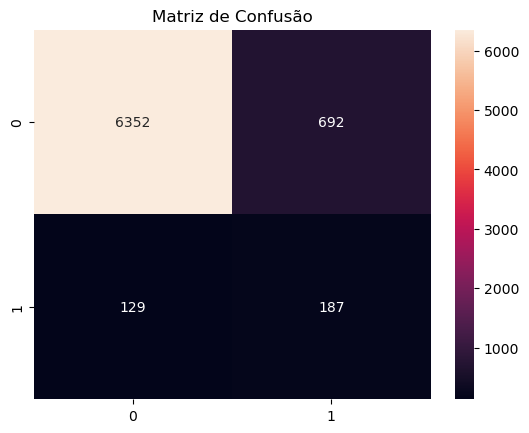

In [190]:
sns.heatmap(confusion_matrix(y_teste, previsoes_arvore), annot=True, fmt='g')
plt.title('Matriz de Confusão')
plt.show()

In [191]:
print(classification_report(y_teste, previsoes_arvore))

              precision    recall  f1-score   support

           0       0.98      0.90      0.94      7044
           1       0.21      0.59      0.31       316

    accuracy                           0.89      7360
   macro avg       0.60      0.75      0.63      7360
weighted avg       0.95      0.89      0.91      7360



## Random Forest

In [192]:
from sklearn.ensemble import RandomForestClassifier

### RandomizedSearch

In [193]:
# parametros = {'criterion':['gini', 'entropy', 'log_loss'],
#              'max_depth':[None, 1, 2, 5, 7, 9],
#              'min_samples_split':[2, 5, 7, 9],
#              'min_samples_leaf':[1, 2, 5, 7, 9],
#              'class_weight': ['balanced', 'balanced_subsample'],
#              'max_features': ['sqrt', 'log2', None]
#              }

# rand = RandomizedSearchCV(estimator=RandomForestClassifier(random_state=0),
#                           param_distributions=parametros,
#                           cv=20,
#                           scoring='f1')

# rand.fit(X_treino, y_treino)

In [194]:
# rand.best_params_

### Treinando o Modelo

In [195]:
random_forest =  RandomForestClassifier(criterion='entropy',
                                        min_samples_leaf = 9,
                                        min_samples_split= 5,
                                        max_depth = None,
                                        class_weight =  'balanced', 
                                        random_state=0)
random_forest.fit(X_treino, y_treino)

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       min_samples_leaf=9, min_samples_split=5, random_state=0)

In [196]:
previsoes_random = random_forest.predict(X_teste)
previsoes_random_proba = random_forest.predict_proba(X_teste)

### Matriz de Confusão e Métricas do Modelo

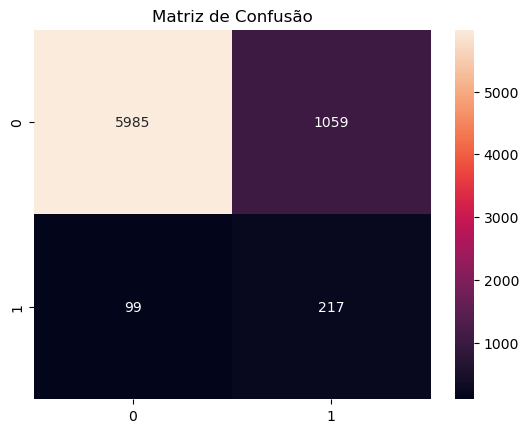

In [197]:
sns.heatmap(confusion_matrix(y_teste, previsoes_random), annot=True, fmt='g')
plt.title('Matriz de Confusão')
plt.show()

In [198]:
print(classification_report(y_teste, previsoes_random))

              precision    recall  f1-score   support

           0       0.98      0.85      0.91      7044
           1       0.17      0.69      0.27       316

    accuracy                           0.84      7360
   macro avg       0.58      0.77      0.59      7360
weighted avg       0.95      0.84      0.88      7360



## KNN

In [199]:
from sklearn.neighbors import KNeighborsClassifier

### GridSearch

In [200]:
# parametros = {'n_neighbors': [5, 9, 13],
#               'weights': ['uniform', 'distance'],
#               'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
#               'p': [1, 2],
#               'metric':['manhattan', 'minkowski', 'l1', 'l2']}

# grid_search = GridSearchCV(estimator=KNeighborsClassifier(),
#                            param_grid=parametros,
#                            scoring='f1')

# grid_search.fit(X_treino, y_treino)
# melhores_parametros = grid_search.best_params_
# melhor_resultado = grid_search.best_score_
# print(melhores_parametros, melhor_resultado)

### Treinando o Modelo

In [201]:
knn = KNeighborsClassifier(algorithm = 'auto',
                           n_neighbors = 5,
                           metric = 'manhattan',
                           p = 1,
                           weights ='distance')
knn.fit(X_treino, y_treino)

KNeighborsClassifier(metric='manhattan', p=1, weights='distance')

In [202]:
previsoes_knn = knn.predict(X_teste)
previsoes_knn_proba = knn.predict_proba(X_teste)

### Matriz de Confusão e Métricas do Modelo

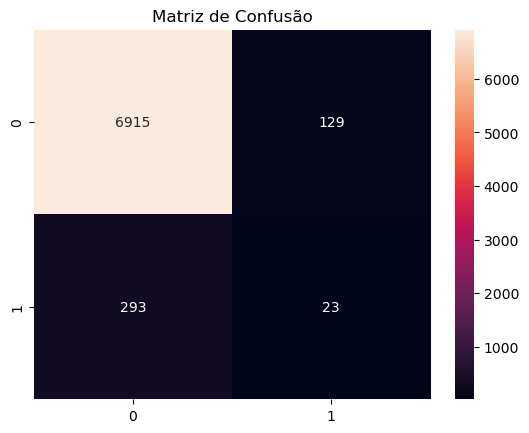

In [203]:
sns.heatmap(confusion_matrix(y_teste, previsoes_knn), annot=True, fmt='g')
plt.title('Matriz de Confusão')
plt.show()

In [204]:
print(classification_report(y_teste, previsoes_knn))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97      7044
           1       0.15      0.07      0.10       316

    accuracy                           0.94      7360
   macro avg       0.56      0.53      0.53      7360
weighted avg       0.92      0.94      0.93      7360



## Regressão Logística

In [205]:
from sklearn.linear_model import LogisticRegression

### GridSearch

In [206]:
# parametros = {'penalty':['l1', 'l2'],
#               'fit_intercept': [True, False],
#              'solver':['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'],
#              'max_iter':[100, 125, 150],
#              'class_weight': [None, 'balanced'],
#              'warm_start': [True, False]}

# grid_search = GridSearchCV(estimator=LogisticRegression(random_state=0),
#                            param_grid=parametros,
#                            scoring='f1')

# grid_search.fit(X_treino, y_treino)
# melhores_parametros = grid_search.best_params_
# melhor_resultado = grid_search.best_score_
# print(melhores_parametros, melhor_resultado)

### Treinando o Modelo

In [207]:
reg_log = LogisticRegression(penalty = 'l2',
                              fit_intercept = False,
                              solver = 'sag',
                              max_iter = 150,
                              class_weight = 'balanced',
                              warm_start = True,
                              random_state=0)

reg_log.fit(X_treino, y_treino)

LogisticRegression(class_weight='balanced', fit_intercept=False, max_iter=150,
                   random_state=0, solver='sag', warm_start=True)

In [208]:
previsoes_reg_log = reg_log.predict(X_teste)
previsoes_reg_log_proba = reg_log.predict_proba(X_teste)

### Matriz de Confusão e Métricas do Modelo

<Axes: >

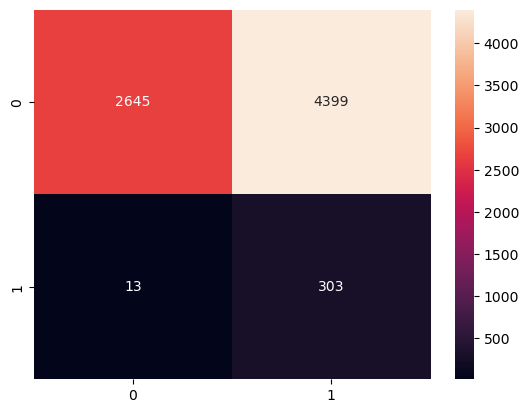

In [209]:
sns.heatmap(confusion_matrix(y_teste, previsoes_reg_log), annot=True, fmt='g')

In [210]:
print(classification_report(y_teste, previsoes_reg_log))

              precision    recall  f1-score   support

           0       1.00      0.38      0.55      7044
           1       0.06      0.96      0.12       316

    accuracy                           0.40      7360
   macro avg       0.53      0.67      0.33      7360
weighted avg       0.96      0.40      0.53      7360



## Escolhendo Melhor Modelo

### ROC

In [211]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, RocCurveDisplay
from sklearn.metrics import precision_recall_curve, PrecisionRecallDisplay

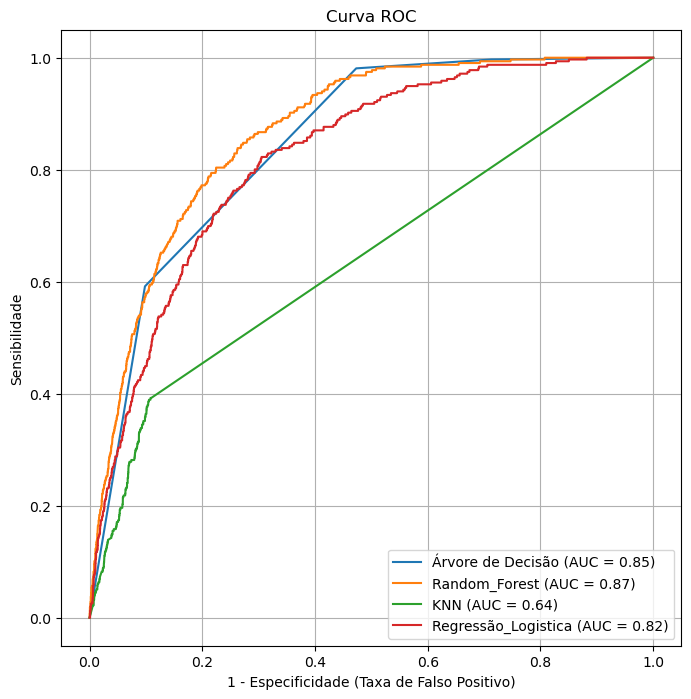

In [212]:
fig, ax = plt.subplots(figsize=(8,8))
RocCurveDisplay.from_predictions(y_teste, previsoes_arvore_proba[:, 1], ax=ax, name='Árvore de Decisão')
RocCurveDisplay.from_predictions(y_teste, previsoes_random_proba[:, 1], ax=ax, name='Random_Forest')
RocCurveDisplay.from_predictions(y_teste, previsoes_knn_proba[:, 1], ax=ax, name='KNN')
RocCurveDisplay.from_predictions(y_teste, previsoes_reg_log_proba[:, 1], ax=ax, name='Regressão_Logistica');

ax.set_title('Curva ROC')
ax.set_xlabel('1 - Especificidade (Taxa de Falso Positivo)')
ax.set_ylabel('Sensibilidade');
ax.grid()


### Curva Precisão-Especificidade

### Validação Cruzada

In [213]:
from sklearn.model_selection import cross_val_score, KFold
import sklearn.metrics as sk
from tqdm import tqdm

In [214]:
resultados_arvore = []
resultados_random_forest = []
resultados_knn = []
resultados_reg_log = []

from sklearn.model_selection import StratifiedKFold

with tqdm(total=100) as barra:
    for i in range(30):
        kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=i)

        arvore = DecisionTreeClassifier(criterion='gini',
                                        max_depth = None,
                                        min_samples_leaf=2,
                                        min_samples_split = 7,
                                        splitter = 'best',
                                        class_weight = 'balanced')
        
        scores = cross_val_score(arvore, X, Y, cv=kfold, scoring='f1')
        resultados_arvore.append(scores.mean())

        
        random_forest = RandomForestClassifier(criterion='gini',
                                               min_samples_leaf = 7,
                                               min_samples_split= 7,
                                               max_depth = None,
                                               class_weight = 'balanced')
                                                                                 
        scores = cross_val_score(random_forest, X, Y, cv=kfold, scoring='f1')
        resultados_random_forest.append(scores.mean())
        
        
        reg_log = LogisticRegression(penalty = 'l2',
                                     fit_intercept = True,
                                     solver = 'lbfgs',
                                     max_iter = 100,
                                     class_weight = 'balanced',
                                     warm_start = True)
        
        scores = cross_val_score(reg_log, X, Y, cv=kfold, scoring='f1')
        resultados_reg_log.append(scores.mean())
        
    
        knn = KNeighborsClassifier(algorithm = 'auto',
                                   n_neighbors= 5,
                                   p = 2, 
                                   weights ='distance')
        
        scores = cross_val_score(knn, X, Y, cv=kfold, scoring='f1')
        resultados_knn.append(scores.mean())        
      
        barra.update(100/30)
    
    

100%|█████████████████████████████████████████████████████████████████▉| 99.99999999999997/100 [04:32<00:00,  2.72s/it]


A ideia desse código é pegar 30 amostras de valores médios do f1 macro para cada modelo, para isso foi utilizado StratifiedKFold visando manter a proporção da variável alvo dentro de cada fold de treino e teste.

In [215]:
resultados = pd.DataFrame({'Arvore': resultados_arvore,
                          'Random_Forest': resultados_random_forest,
                          'KNN': resultados_knn,
                          'Regressao_Logistica': resultados_reg_log})

In [216]:
fig = px.bar(resultados.mean(), color=resultados.columns)

fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
}, title='Valor médio obtido para F1 para Cada Modelo')

fig.update_yaxes(title='Percentual %')
fig.update_xaxes(title='Modelo')

fig.update_layout(showlegend=False)

fig.show()

In [217]:
fig = px.bar((resultados.std() / resultados.mean()), color=resultados.columns)

fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
}, title='Coeficiente de Variação para do F1 para cada Modelo')

fig.update_yaxes(title='Percentual %')
fig.update_xaxes(title='Modelo')

fig.update_layout(showlegend=False)

fig.show()

### Teste de Normalidade (Shapiro-Wilk)

In [218]:
from scipy.stats import shapiro
from tabulate import tabulate

Caso o p-valor seja > 0.05, pode-se dizer que a distribuição dos valores se assemelha a uma normal.

In [219]:
teste_normal = {'Árvore de Decisão': shapiro(resultados_arvore)[1],
                'Random Forest':  shapiro(resultados_random_forest)[1],
                'KNN': shapiro(resultados_knn)[1],
                'Regressão Logística': shapiro(resultados_reg_log)[1]}

print(tabulate(teste_normal.items(), headers=['Classificador', 'P-valor'], tablefmt='psql'))

+---------------------+-----------+
| Classificador       |   P-valor |
|---------------------+-----------|
| Árvore de Decisão   |  0.93718  |
| Random Forest       |  0.960596 |
| KNN                 |  0.247631 |
| Regressão Logística |  0.637973 |
+---------------------+-----------+


### Teste Tukey

In [220]:
tukey_df = pd.melt(resultados, 
                   value_vars=['Arvore', 'Random_Forest', 'KNN', 'Regressao_Logistica']).rename(columns={'variable':'Algoritmo',
                                                                                                         'value':'F1'})

In [221]:
from statsmodels.stats.multicomp import MultiComparison
compara_algoritmos = MultiComparison(tukey_df['F1'], tukey_df['Algoritmo'])

Se o p-valor < 0.05, os resultados dos algoritmos são diferentes.

In [222]:
teste_estatistico = compara_algoritmos.tukeyhsd()
print(teste_estatistico)

          Multiple Comparison of Means - Tukey HSD, FWER=0.05          
    group1           group2       meandiff p-adj  lower   upper  reject
-----------------------------------------------------------------------
       Arvore                 KNN  -0.1135   0.0 -0.1169 -0.1101   True
       Arvore       Random_Forest   0.0661   0.0  0.0627  0.0696   True
       Arvore Regressao_Logistica   0.0273   0.0  0.0239  0.0308   True
          KNN       Random_Forest   0.1796   0.0  0.1762  0.1831   True
          KNN Regressao_Logistica   0.1408   0.0  0.1374  0.1443   True
Random_Forest Regressao_Logistica  -0.0388   0.0 -0.0423 -0.0354   True
-----------------------------------------------------------------------


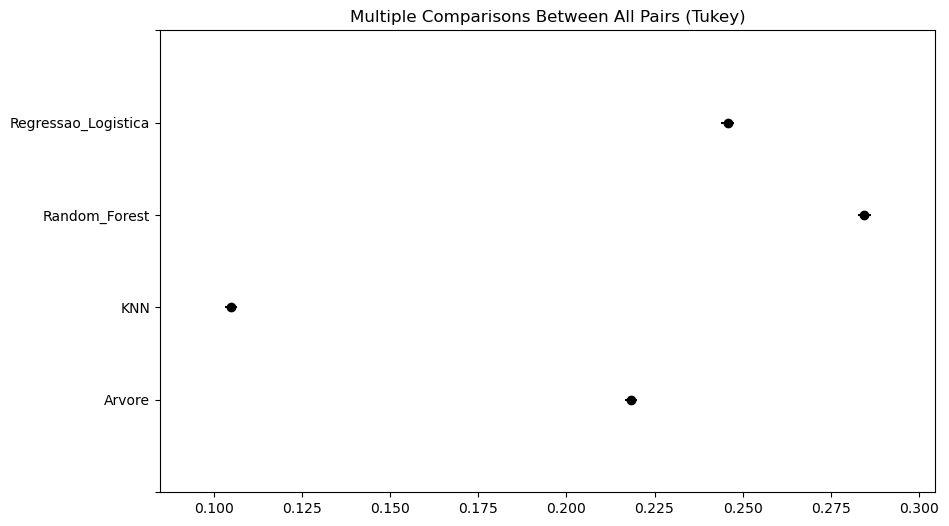

In [223]:
teste_estatistico.plot_simultaneous();

## Entendendo a importância das Variáveis com LIME e SHAP

In [224]:
X = df_2.iloc[:, :-1]
X['age'] = scaler.fit_transform(X['age'].values.reshape(-1, 1))
Y = df_2.iloc[:, -1]

from sklearn.model_selection import train_test_split
X_treino, X_teste, y_treino, y_teste = train_test_split(X, Y, test_size=0.5, stratify = Y, random_state=0)

### LIME

In [225]:
import lime
from lime import lime_tabular
classificadores = ['Random Forest', 'Decision Tree', 'KNN', 'Logistic Regression']

modelos = [random_forest, arvore, knn, reg_log]

for i, pipe in enumerate(modelos):
    print(classificadores[i])
    modelo = pipe.fit(X_treino, y_treino)
    test = X_teste.iloc[4]
    lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_treino),
    feature_names=X_treino.columns,
    class_names=['não AVC', 'AVC'],
    mode='classification'
    )
    lime_exp = lime_explainer.explain_instance(
    data_row=test,
    predict_fn=modelo.predict_proba
    )
    lime_exp.show_in_notebook(show_table=True)

Random Forest


Decision Tree


KNN


Logistic Regression


### SHAP

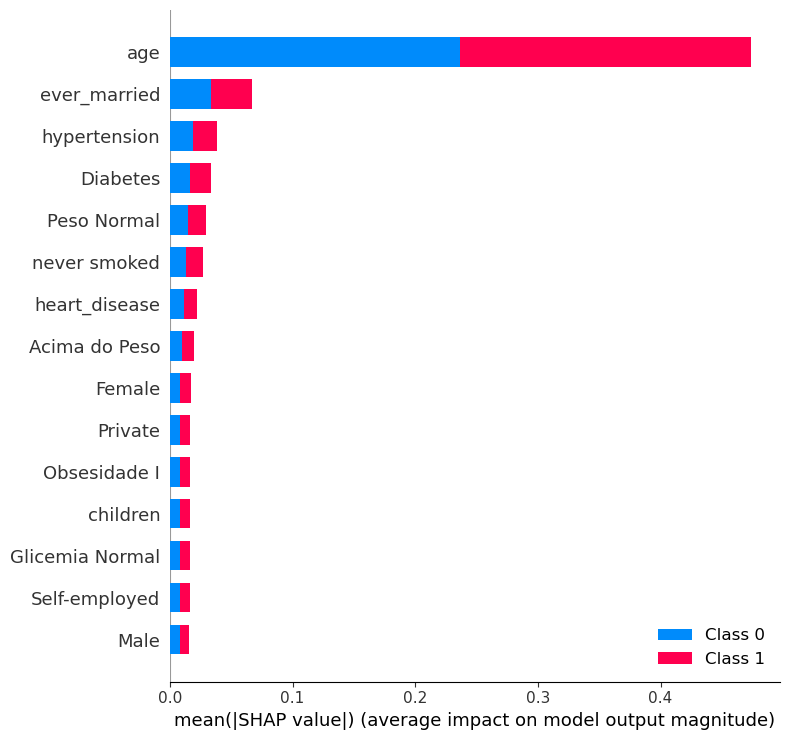

In [226]:
import shap
explainer = shap.TreeExplainer(random_forest)
shap_values = explainer.shap_values(X_teste)
shap.summary_plot(shap_values, X_teste, plot_type='bar', max_display=15)

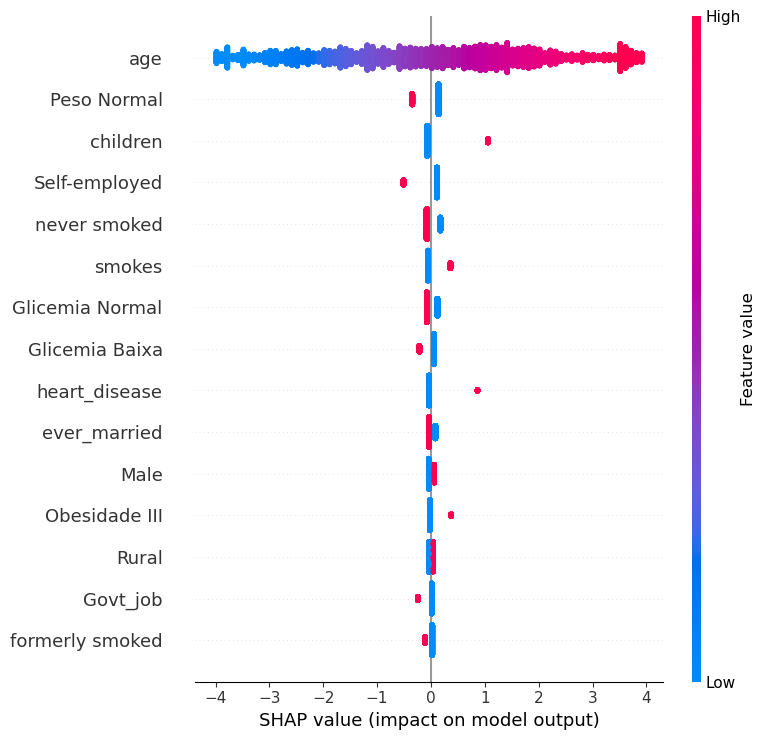

In [227]:
import shap
explainer = shap.LinearExplainer(reg_log, X_teste)
shap_values = explainer.shap_values(X_teste)
shap.summary_plot(shap_values, X_teste, max_display=15)